<a href="https://colab.research.google.com/github/FrancoisHUP/TP1_INF889G/blob/main/INF889G_TP1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# TP1 INF 889G H24

François Huppé-Marcoux

Guillaume Carignan

## Setup


Github link : https://github.com/FrancoisHUP/TP1_INF889G/

In [ ]:
# Pull data from github
import os
import requests

urls = [
  'https://raw.githubusercontent.com/FrancoisHUP/TP1_INF889G/main/data/d1_ex1_im1.jpg',
  'https://raw.githubusercontent.com/FrancoisHUP/TP1_INF889G/main/data/d1_ex1_im2.jpg',
  'https://raw.githubusercontent.com/FrancoisHUP/TP1_INF889G/main/data/d1_ex1_im3.jpg',
  'https://raw.githubusercontent.com/FrancoisHUP/TP1_INF889G/main/data/d1_ex1_im4.jpg',
  'https://raw.githubusercontent.com/FrancoisHUP/TP1_INF889G/main/data/d1_ex1_im5.jpg',
  'https://raw.githubusercontent.com/FrancoisHUP/TP1_INF889G/main/data/d1_ex2.png',
  'https://raw.githubusercontent.com/FrancoisHUP/TP1_INF889G/main/data/d1_ex3.pcl',
  'https://raw.githubusercontent.com/FrancoisHUP/TP1_INF889G/main/annotations.txt'
]

# create data rep
if not os.path.exists('data'):
    os.makedirs('data')

# download images
for url in urls:
  r = requests.get(url)
  filename = url.split('/')[-1]
  with open('data/' + filename, 'wb') as f:
      f.write(r.content)

annotations.txt  d1_ex1_im2.jpg  d1_ex1_im4.jpg  d1_ex2.png
d1_ex1_im1.jpg	 d1_ex1_im3.jpg  d1_ex1_im5.jpg  d1_ex3.pcl


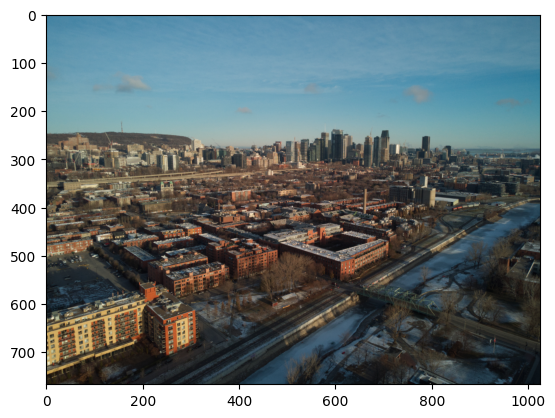

In [ ]:
# plot image
import matplotlib.pyplot as plt
from PIL import Image

!ls data
plt.imshow(Image.open('data/d1_ex1_im1.jpg'))
plt.show()

## Exercice 1 : High Dynamic Range (HDR) (5 pts)

Voici les images fournies pour l'exercice 1.

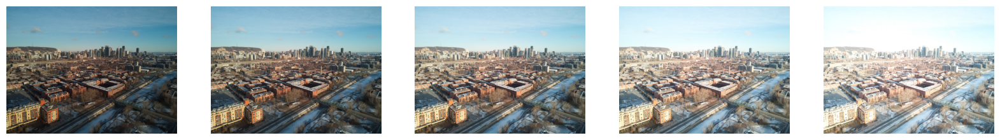

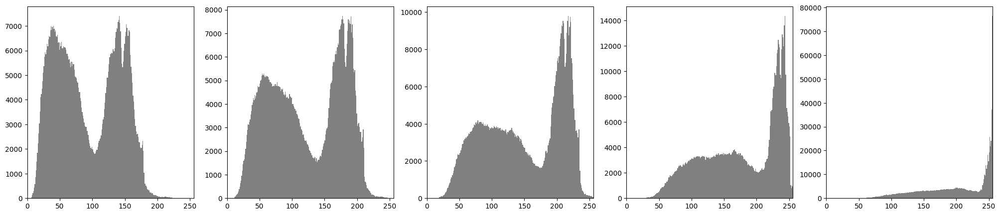

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def plot_images(images):
  # Create a subplot with 1 row and 5 columns
  fig, axs = plt.subplots(nrows=1, ncols=len(images), figsize=(20, 5))

  for i, img in enumerate(images):
      axs[i].imshow(img)
      axs[i].axis('off')

  plt.show()

def plot_histograms(images):
    # New function to plot histograms
    fig, axs = plt.subplots(nrows=1, ncols=len(images), figsize=(25, 5))
    for i, img in enumerate(images):
        # Convert the image to grayscale for the histogram
        gray_img = img.convert('L')
        # Calculate histogram
        histogram = np.array(gray_img).flatten()
        axs[i].hist(histogram, bins=256, range=(0, 256), color='gray')
        axs[i].set_xlim(0, 256)
        axs[i].axis('on')
    plt.show()

filenames = [
  'd1_ex1_im1.jpg',
  'd1_ex1_im2.jpg',
  'd1_ex1_im3.jpg',
  'd1_ex1_im4.jpg',
  'd1_ex1_im5.jpg',
]

# Get images
images_og = [Image.open(f'data/{filename}') for filename in filenames]

plot_images(images_og)
plot_histograms(images_og)

### a) Soit une série d’images d’une même scène acquises pour différents niveaux d’exposition. Expliquez la différence d’apparence entre ces images, en mentionnant les régions sous-exposées et surexposées.

En regardant ces images, on voit une différence dans la distribution des intensités. Un pixel est plus lumineux si la moyenne des trois couleurs est grande. La dernière image (à droite) est particulièrement blanche. En regardant l'histogramme (fréquence des intensités), on voit que la plupart des pixels sont au-delà de 225 avec un gros pic à 255. L'image est clairement surexposée (sans jeu de mot). Le ciel proche de l'horizon est composé en grande partie de pixels blancs. Tandis que les autres images ont des différences marquées dans les couleurs du ciel. Une image surexposée perdra ses détails car les pixels dépassent les limites de l'appareil à capturer la scène (les capteurs sont saturés).

À l'inverse, une image contient des zones sous-exposées. Par exemple, le bas gauche de l'image, où se trouve la rue et le côté gauche des bâtiments, a une luminosité basse. Heureusement, ici l'information est dans l'image, mais la différence entre les pixels est si minime que l'œil humain n'arrive pas à les distinguer (plus sur ce sujet à la réponse C).

La deuxième image contient une bonne balance entre des pixels d'intensité moyenne. Il n'y a pas de pixel surexposé (pas de valeur à 255) et les pixels à faible intensité sont distinguables à l'œil nu. Par contre, il y a tout de même des zones (comme la rue en bas à gauche) peu éclairées.

Bien sûr, la première image contient les intensités les plus faibles et plus on avance vers la droite, plus les images ont des intensités élevées. Les histogrammes démontrent bien la saturation.

La luminosité d'une image dépend du temps d'ouverture d'un appareil photographique. Lors de la prise d'une photo, l'obturateur s'ouvre durant une certaine période de temps pour laisser entrer la lumière. Si cette période est trop longue, l'appareil capture trop de lumière d'où l'effet de surexposition.

### b) Proposez et implémentez un algorithme de traitement d’images qui détecte les régions dont l’exposition est ni sous-exposée ni surexposée dans chaque image et qui crée une image synthétique combinant les régions détectées pour chacune. Expliquez vos choix de paramètres pour la fusion d’images.


__Explications Algorithmique__

Que peut-on faire pour faire ressortir les zones sous-exposées et sur-exposées ? On veut prendre les régions qui ne sont ni surexposées ni sous-exposées et donner plus de poids à l'image finale.

Pour créer un masque :
- Pour tous les pixels :
  - pour un pixel sous-exposé ou surexposé : on met une petite valeur dans le filtre
  - pour les valeurs qui se rapprochent d'une intensité moyenne (valeur décidée arbitrairement), on met des valeurs élevées dans le filtre.
  

Donc, plus la valeur du pixel se rapproche d'une intensité moyenne, plus la valeur de filtre qui lui sera attribuée sera grande. Pour créer un filtre où les valeurs qui s'éloignent de 0,5 auront une intensité finale plus petite, on peut utiliser la fonction gaussienne. La gaussienne prend en entrée un nombre entre -3 et 3 (au-delà, les valeurs sont négligeables, on peut les ignorer). On donne l'intensité d'un pixel à la fonction et elle retourne une valeur selon la gaussienne. Celle-ci sera plus haute si l'intensité se rapproche de la valeur médiane arbitraire que l'on a donnée.

<br>

On peut calculer la différence entre l'image et la médiane arbitraire. On calcule la valeur pondérée d'un pixel selon la formule suivante :

__Pondérons les pixels__

$$ z_i = \frac{x_i-\mu}{\sigma_i}  $$

où :

\( z \) Valeur pondéré d'un pixel

\( $x_i$ \) L'intensité d'un pixel

\( $\mu$ \) Valeur mediane arbitraire

\( $\sigma_i$ \) l'écart type des pixels

\( i \) Represente l'image $i$ parmis les $n$ images

$z$ donne une valeur comprise entre -3 et 3. Comme la gaussienne normalisée prend des valeurs entre [-3,3], nous avons ajouté un paramètre appelé HDR pour contrôler l'aire sous la courbe de la gaussienne. Un nombre plus élevé aura pour effet de diminuer l'aire sous la courbe de la gaussienne, tandis qu'un plus petit nombre aplatira la courbe. Concrètement, ce paramètre contrôle la force de l'effet HDR sur l'image.

On choisit quelle valeur on veut prendre comme intensité moyenne. Avec une intensité moyenne haute, l'image résultante aura en moyenne une plus haute intensité, et l'inversement.

<br>

Sur les valeurs des pixels normalisés, on applique la gaussienne qui calcule le poids des pixels. Les valeurs se rapprochant de la médiane arbitraire auront un plus grand poids. Voici la formule à appliquer :

__Appliquer un filtre gaussien__

$$ FiltreGaussien_i = e^\left(-hdr * z_i^2\right)  $$

où :

\( $hdr$ \) Force de l'effet HDR

<br>

Finalement, on peut additionner les $n$ (nombre d'images) filtres en faisant une multiplication matricielle avec les images originales correspondant au filtre pour créer une nouvelle image résultante. La division par $n$ normalise l'image resultante sur un valeur entre 0 et 1. En pratique, par la suite on peut utilisé une fonction pour reconvertir sur 255 pour afficher l'image en RGB.

__Fusionner les images__  

$$ Img_{HDR} = \sum_{i=0}^{n} \left( img[i] * filtreGaussien[i] /n \right)  $$

où :

\( $n$ \) Nombre d'image à fusionner

<br>

__Resumé des opérations :__

$$ Img_{HDR} = \sum_{i=0}^{n} \left( img[i] * e^\left(-hdr * \left( \frac{x_i-\mu}{\sigma_i} \right)^2\right) /n \right)  $$


__En Code__

Concretement, il faut :
- Créer un filtre selon un valeur arbitraire (0.5, dans ce cas-ci)
- Normailser les filtres $i/n$ (intensité des pixels sur le nombre d'image)   
- Multiplier les filtres avec leurs image correspondante en couleur.
- Additionner les pixels des $n$ nouvelles images

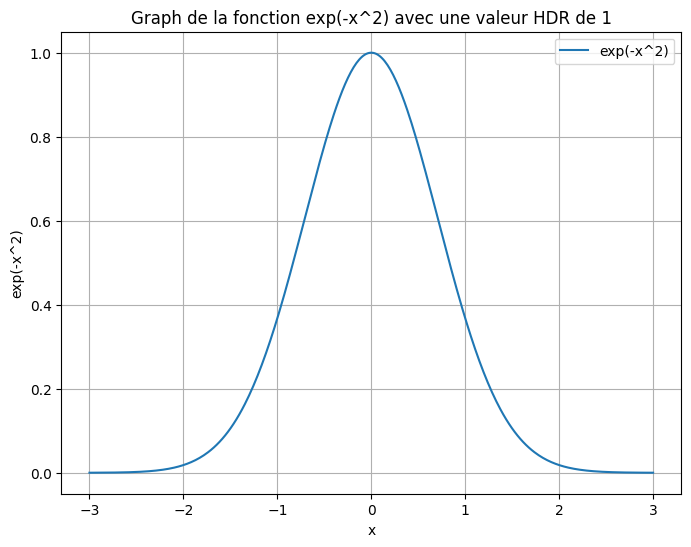

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def print_gaussian(hdr=1, lowest=-3 ,highest=3):
  '''
  This is the Gaussian normalize. It's only an example in oder to play with the hdr parameter
  '''
  # hdr force
  hdr=1

  # Define the range of x from -3 to 3
  x = np.linspace(lowest, highest, 400)

  # Define the function exp(-x^2)
  y = np.exp(-hdr * x**2)

  # Plot the function
  plt.figure(figsize=(8, 6))
  plt.plot(x, y, label='exp(-x^2)')
  plt.title('Graph de la fonction exp(-x^2) avec une valeur HDR de ' +  str(hdr))
  plt.xlabel('x')
  plt.ylabel('exp(-x^2)')
  plt.grid(True)
  plt.legend()
  plt.show()

print_gaussian()

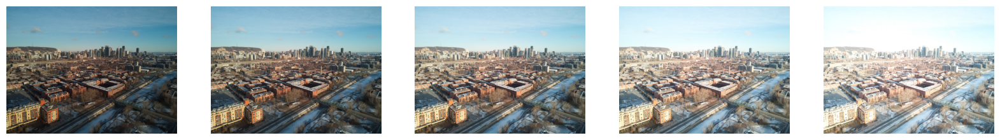

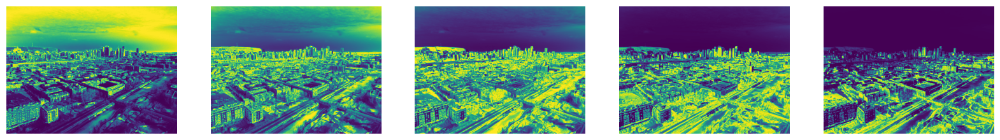

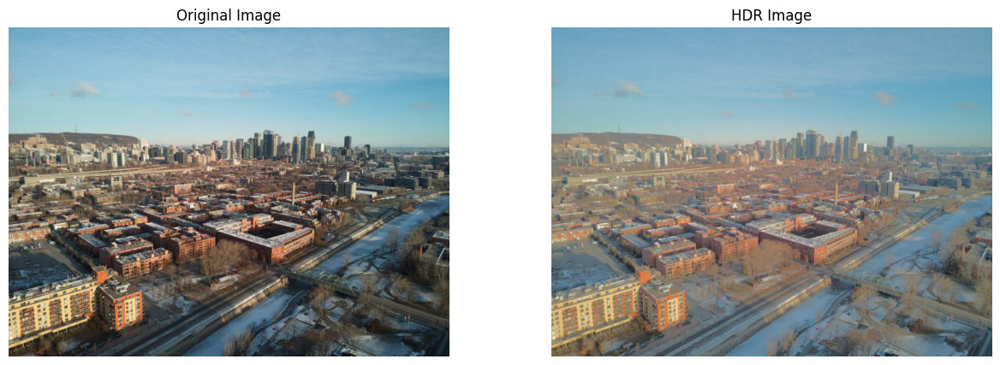

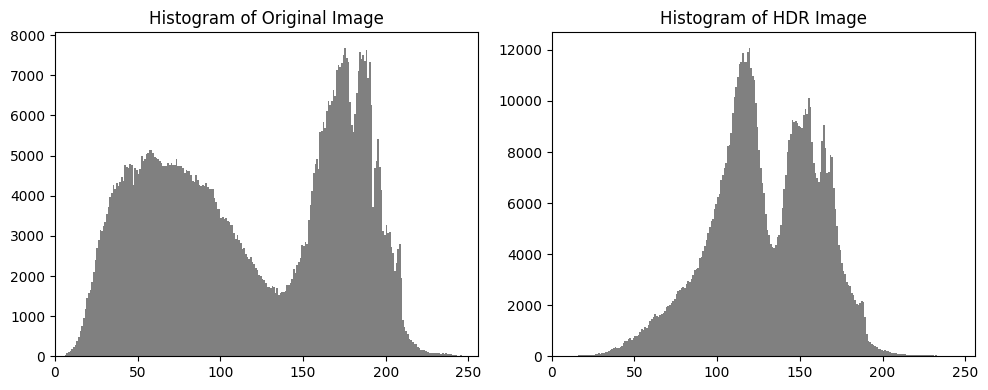

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to merge images based on the weight maps
def merge_images(images, filters):
    # Initialize an empty image for the result
    result_image = np.zeros_like(images[0])

    # Add each image to the result image weighted by the weight map
    for image, filter in zip(images, filters):
        for channel in range(image.shape[2]):
            result_image[:,:,channel] += image[:,:,channel] * filter
    return result_image

# Function to calculate the weight map for each pixel based on its luminance
def calculate_filters(image, mid_exposure=0.5, hdr=1, epsilon=0.01,):
    # Convert image to grayscale to get luminance
    luminance = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    std_dev = np.std(luminance)
    # Calculate weight map with gaussian-like curve around mid exposure
    # The epsilon is used to avoid division by zero
    filter = np.exp(-hdr * np.square((luminance - mid_exposure) / (epsilon + std_dev)))

    return filter

def hdr(images, hdr=1, mid_exposure=0.5, epsilon=0.01):
  """
  Combines a list of images with varying exposures into a single High Dynamic Range (HDR) image.

  Parameters:
  ----------
  images (list of ndarray): Images to be merged, each with different exposures.
  hdr (float, optional): Currently unused. Intended for future HDR processing control.
  epsilon (float, optional): Prevents division by zero in weight calculation, defaults to 0.01.
  mid_exposure (float, optional): Mid-point of exposure for weight calculation, defaults to 0.5.

  Returns:
  ----------
  ndarray: The resulting HDR image.

  Each image is first transformed into a weight map based on luminance. These maps are normalized
  and used to merge the images into a final HDR image.
  """
  global filters

  # Calculate weight maps for each image
  filters = [calculate_filters(img, hdr=hdr, mid_exposure=mid_exposure) for img in images]

  # Normalize the weight maps
  normalized_filters = [filter / np.sum(filters, axis=0) for filter in filters]

  # Merge the images
  hdr_image = merge_images(images, normalized_filters)

  return hdr_image

def plot_histogram(image, title, ax):
    """
    Plots the histogram of the given image.

    Parameters:
    - image (ndarray): The image for which the histogram is to be plotted.
    - title (str): The title for the histogram plot.
    - ax (matplotlib.axes.Axes): The axes on which to plot the histogram.
    """
    # Convert the image to grayscale for the histogram
    gray_img = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Calculate the histogram
    histogram = gray_img.flatten()

    # Plot the histogram
    ax.hist(histogram, bins=256, range=(0, 256), color='gray')
    ax.set_xlim(0, 256)
    ax.set_title(title)


# Load the images
image_files = [
    'data/d1_ex1_im1.jpg',
    'data/d1_ex1_im2.jpg',
    'data/d1_ex1_im3.jpg',
    'data/d1_ex1_im4.jpg',
    'data/d1_ex1_im5.jpg'
]

# List to hold the images
images = [cv2.imread(file) for file in image_files]

# Normalize image to float32 value between 0 and 1
images = [img.astype(np.float32) / 255.0 for img in images]

# Calulate hdr image
hdr_image = hdr(images, mid_exposure=0.5, hdr=1)

# Check the difference btween the original image and the HDR version
diff = (images[1] - hdr_image) * 5

def plot_ex1_b():
  # Show the images
  plot_images(images_og)
  plot_images(filters)

  # Display the original and equalized images
  fig, ax = plt.subplots(1, 2, figsize=(15, 5))

  # Original image
  ax[0].imshow(cv2.cvtColor(images[1], cv2.COLOR_BGR2RGB))
  ax[0].set_title('Original Image')
  ax[0].axis('off')

  # Equalized image
  ax[1].imshow(cv2.cvtColor(hdr_image, cv2.COLOR_BGR2RGB))
  ax[1].set_title('HDR Image')
  ax[1].axis('off')

  # ax[2].imshow(cv2.cvtColor(diff, cv2.COLOR_BGR2RGB)) # if you uncomment change plt.subplots(1, 3, figsize=(15, 5))
  # ax[2].set_title('Difference Between Images')
  # ax[2].axis('off')

  # Create a figure with 2 subplots (2 histograms)
  fig, axes = plt.subplots(1, 2, figsize=(10, 4))

  # Normalize HDR image back to 8-bit for histogram calculation
  og_image_normalized = cv2.normalize(images[1], None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

  # Plot histogram for the original image
  plot_histogram(og_image_normalized, 'Histogram of Original Image', axes[0])

  # Normalize HDR image back to 8-bit for histogram calculation
  hdr_image_normalized = cv2.normalize(hdr_image, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

  # Plot histogram for the HDR image
  plot_histogram(hdr_image_normalized, 'Histogram of HDR Image', axes[1])

  plt.tight_layout()
  plt.show()

plot_ex1_b()



Voici une démo interactive !

*Google Colab prend un petit moment (normalement moins de 2-3 secondes) à rafraîchire l'image 😉


In [ ]:
!pip install ipywidgets > /dev/null && echo "Installation completed!" || echo "Installation failed!"

Installation completed!


In [ ]:
import ipywidgets as widgets
from IPython.display import display, clear_output
import matplotlib.pyplot as plt

def normalize(image):
    return (image - np.min(image)) / (np.max(image) - np.min(image))

def hdr_interactive(hdr_value, mid_exposure_value):
    clear_output(wait=True)  # Clear the previous output
    result_image = hdr(images, hdr=hdr_value, mid_exposure=mid_exposure_value)

    result_image_normalized = normalize(result_image)  # Normalize your image here

    # Create a figure with two subplots
    fig, ax = plt.subplots(1, 2, figsize=(12, 6))

    # Display the image
    ax[0].imshow(cv2.cvtColor(result_image_normalized, cv2.COLOR_BGR2RGB))
    ax[0].axis('off')  # Hide the axis on the image plot

    # Create a histogram
    # If your image is grayscale, this is straightforward; adjust if your image is in color
    if len(result_image_normalized.shape) == 2:  # Grayscale image
        ax[1].hist(result_image_normalized.ravel(), bins=256, range=[0, 1], color='black')
    else:  # Color (RGB) image
        colors = ['red', 'green', 'blue']
        for i, color in enumerate(colors):
            ax[1].hist(result_image_normalized[:, :, i].ravel(), bins=256, range=[0, 1], color=color, alpha=0.5)

    ax[1].set_title('Histogram')
    ax[1].set_xlim([0, 1])  # Assuming the image is normalized

    plt.tight_layout()
    plt.show()


# Create sliders
hdr_slider = widgets.FloatSlider(value=1.0, min=0, max=3.0, step=0.1, description='HDR:')
mid_exposure_slider = widgets.FloatSlider(value=0.5, min=0, max=1.0, step=0.05, description='Mid Exposure:')

# Display the interactive sliders
widgets.interactive(hdr_interactive, hdr_value=hdr_slider, mid_exposure_value=mid_exposure_slider)



interactive(children=(FloatSlider(value=1.0, description='HDR:', max=3.0), FloatSlider(value=0.5, description=…

### c) Expliquez le lien entre la grande plage dynamique pour la perception visuelle humaine et la méthode HDR pour la vision par ordinateur.

La plage dynamique pour la perception visuelle est la plage de niveaux de luminosité que l'œil peut s'adapter. L'œil possède des cônes et des bâtonnets qui sont des cellules photosensibles sur la rétine, il est important de souligner que ceux-ci ne sont pas placés uniformément sur celle-ci. Les cônes sont responsables de la distinction des couleurs tandis que les bâtonnets sont responsables de la perception de l'intensité lumineuse. Ce sont les bâtonnets qui permettent à l'œil de "capter" plus ou moins de lumière. C'est à cause d'eux qu'il est possible de distinguer des formes après un certain temps d'adaptation dans une pièce sombre, tout en évitant d'être constamment ébloui dans un environnement très lumineux. La plage dynamique est cette capacité de l'œil humain à gérer les différences de luminosité tout en distinguant les formes et les couleurs. Bien sûr, avec une luminosité faible, les couleurs ressortent moins marquées. Sous différents éclairages, les couleurs d'un objet peuvent être distordues à cause de l'absorption des photons par l'objet, dépendant de la couleur de celui-ci et de la fréquence lumineuse.

Notre œil a la capacité de faire ce que l'on nomme le phénomène d'accomodation, c'est-à-dire que l'on peut dynamiquement s'adapter à la luminosité présente dans la scène que l'on observe grâce à la taille de la pupille par exemple mais aussi aux microsaccades et microtremblements qui permettent d'exposer d'autres régions de la scène à notre rétine (les cônes responsables de la couleur sont presque tous concentrés à la fovéa et inversement pour les bâtonnets). Cela a pour effet de stimuler des cellules photosensibles différentes et notre cerveau interpole et reconstruit ce que nous voyons en combinant toutes les informations reçues (ce qui explique pourquoi l'on peut aussi le tromper avec illusions/persistance et autres effets). Nous effectuons déjà plusieurs acquisitions de ce que nous observons sans nous en rendre compte et c'est ce que la méthode HDR essaye de reproduire. Nous effectuons plusieurs acquisitions avec des paramètres de la caméra en variant le temps d'exposition. En combinant adéquatement les images capturées, cela nous permet de simuler le travail d'accommodation et d'interpolation que notre cerveau fait en éclairant les endroits sous-exposés et en réduisant l'intensité lumineuse aux endroits surexposés.


Par exemple, les temps d'ouverture d'une image HDR sont de 15s, 2.5s, 1/4s et 1/30s. Cela donne les images suivantes :

![HDR images](https://docs.opencv.org/4.x/exposures.jpg "Convolution equation") https://docs.opencv.org/4.x/d2/df0/tutorial_py_hdr.html

L'image en haut à gauche est la plus lumineuse. Le temps d'ouverture est le plus long (15s). Cela donne le temps à l'appareil d'accumuler assez de lumière à un point où on n'arrive plus à distinguer les détails du bâtiment. L'image en bas à droite est la moins lumineuse, la caméra capte seulement les zones où il y a plus de lumière.

En appliquant un algorithme HDR, on obtient un résultat suivant :

![HDR images](https://docs.opencv.org/4.x/fusion_mertens.jpg "Convolution equation") https://docs.opencv.org/4.x/d2/df0/tutorial_py_hdr.html

L'algorithme appliqué ici est le [Mertenes Fusion](https://www.researchgate.net/profile/Tom-Mertens/publication/4295602_Exposure_Fusion/links/53f716940cf2888a7497691d/Exposure-Fusion.pdf) qui crée des matrices de poids avec les images de base pour ensuite les fusionner ensemble. Il prend en compte la saturation, les contrastes, les zones avec une bonne exposition. L'algorithme utilise aussi la pyramide de Laplace pour obtenir des informations sur les caractéristiques de l'image à différentes résolutions. Cette technique est utilisée pour ne pas avoir de changements trop brusques d'intensité.

En bref, les techniques de HDR sont utilisées pour ajuster la luminosité d'une image pour imiter la capacité de l'œil à s'adapter à l'intensité. Cette technique peut être appliquée dans plusieurs domaines, notamment :

- Lors de la prise d'images de paysages où les intensités lumineuses varient beaucoup.
- Lors de la prise d'images de vente/location de logements (ajuster la luminosité pour faire paraître les logements plus lumineux - c'est plus vendeur).
- Lorsqu'il y a présence de rétroéclairage (une lumière de fond qui est forte et qui rend les objets proches de la caméra pratiquement noirs). Alors on peut récupérer les détails cachés.
- Pour prendre des photos d'objets métalliques qui reflètent beaucoup de lumière.
- Et dans d'autres domaines.








### d) En vous référant à l’article [(Debevec,1997)](https://dl.acm.org/doi/pdf/10.1145/258734.258884), quelle amélioration pourriez-vous apporter à votre approche de synthèse d’image HDR?

Il est certain que sans les temps d'exposition des 5 images que nous avons, les techniques décrites dans l'article sont difficilement appliquables. Ce que nous pourrions faire est d'attribuer un temps d'exposition estimé pour chaqune des images et d'ajuster jusqu'à avoir un résultat qui nous plaît. Nous pourrions aussi ajuster notre méthode qui utilise déjà la 'radiance map'. Dans cette amélioration, nous nous réferrons au code disponible sur https://docs.opencv.org/3.4/d2/df0/tutorial_py_hdr.html


[0.0625 0.125  0.25   0.5    1.    ]


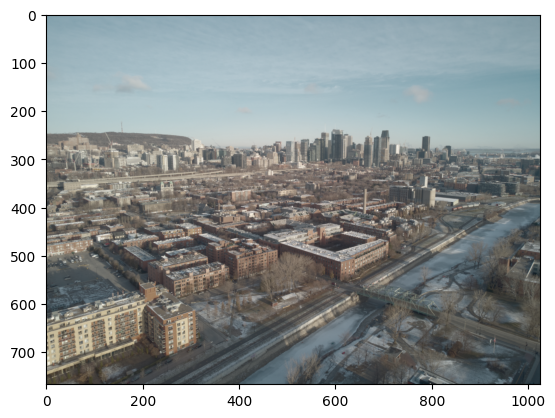

[0.125 0.25  0.5   1.    2.   ]


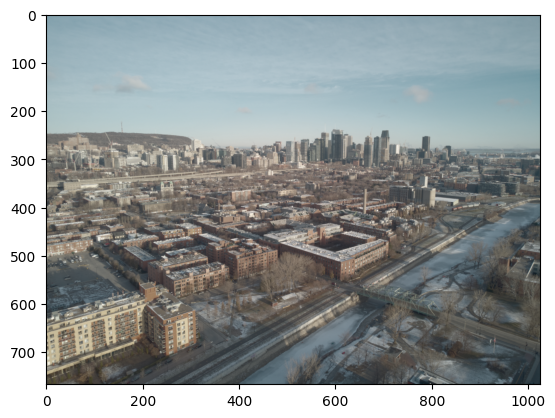

[0.1875 0.375  0.75   1.5    3.    ]


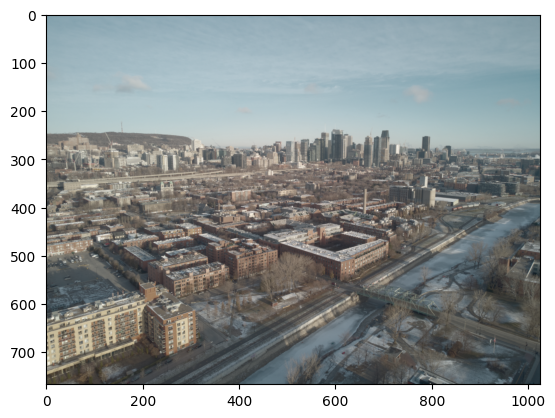

[0.25 0.5  1.   2.   4.  ]


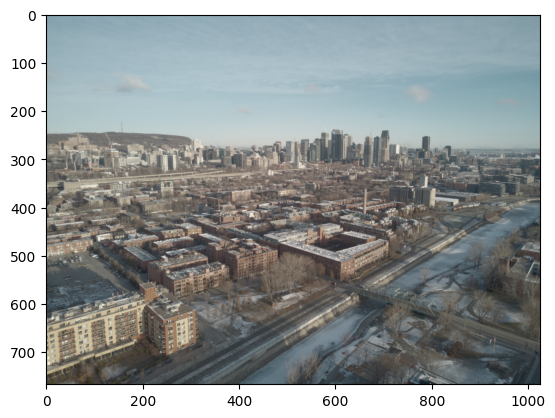

[0.3125 0.625  1.25   2.5    5.    ]


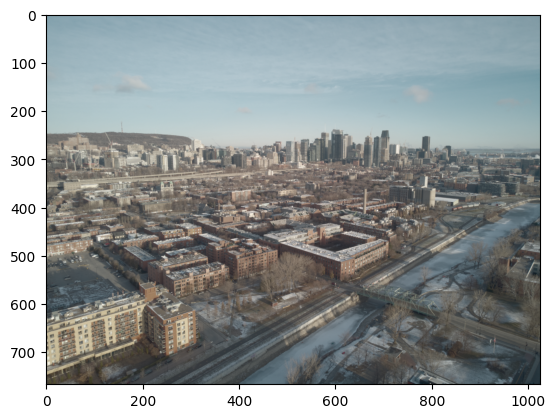

[0.375 0.75  1.5   3.    6.   ]


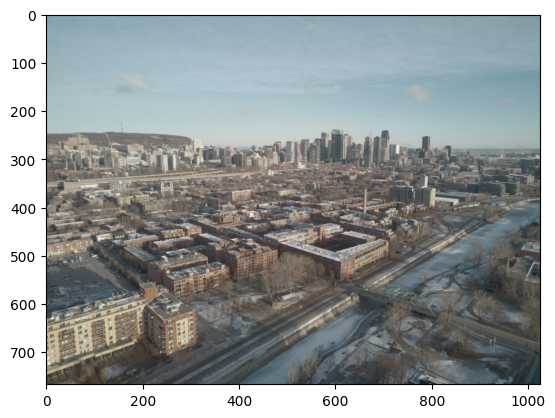

[0.4375 0.875  1.75   3.5    7.    ]


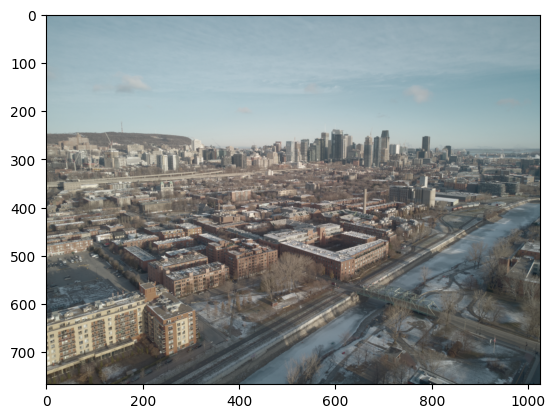

[0.5 1.  2.  4.  8. ]


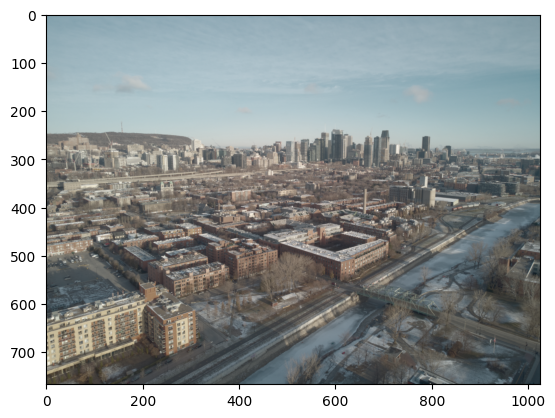

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

exp_max_array = [1, 2, 3, 4, 5, 6, 7, 8] #Essayons avec divers temps d'exposition max

image_files = [
    "data/d1_ex1_im1.jpg",
    "data/d1_ex1_im2.jpg",
    "data/d1_ex1_im3.jpg",
    "data/d1_ex1_im4.jpg",
    "data/d1_ex1_im5.jpg"
]
img_list = [np.array(Image.open(fn)) for fn in image_files]

def debevec_from_doc(img_list, exp_max):
  exposure_times = np.array([exp_max/pow(2, 4), exp_max/pow(2, 3), exp_max/pow(2, 2), exp_max/pow(2, 1), exp_max/pow(2, 0)], dtype=np.float32) #Temps exposition avec puissances de 2
  print(exposure_times)
  merge_debevec = cv.createMergeDebevec()
  hdr_debevec = merge_debevec.process(img_list, times=exposure_times.copy())
  tonemap1 = cv.createTonemap(gamma=2.2)
  res_debevec = tonemap1.process(hdr_debevec.copy())
  res_debevec_8bit = np.clip(res_debevec*255, 0, 255).astype('uint8')
  plt.imshow(res_debevec_8bit)
  plt.show()

for e in exp_max_array:

  debevec_from_doc(img_list, e)




## Exercice 2 : Filtrage spatial (5 pts)


### a) Implémentez un filtre moyenneur de tailles 3x3 et 5x5. Appliquez votre filtre à l’image d1_q2.png. Note : vous devez programmer vous-même le déplacement du filtre dans l’image, vous ne devez pas utiliser une méthode existante pour faire la convolution.

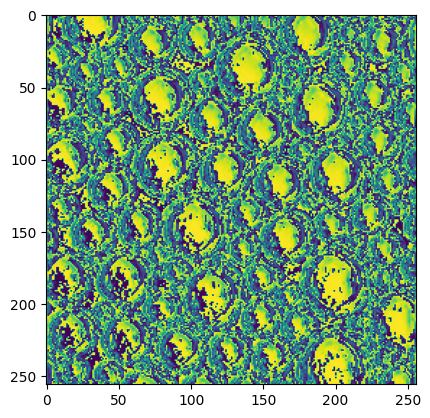

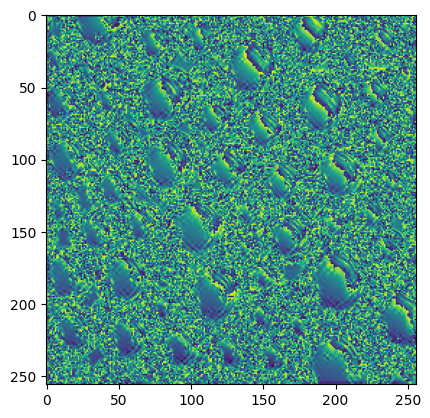

In [ ]:
import numpy as np
import cv2
from PIL import Image
from typing import Optional

def apply_filter(image_path: str,
                 filter_matrix: np.ndarray,
                 padding_type: str,
                 output_path: Optional[str] = None,
                 constant_value: Optional[str] = 0) -> Image.Image :
    """
    This function applies a spatial filter to an image
    :param image_path: path to the image
    :param filter_matrix: the filter to apply
    :param padding_type: the type of padding to apply. Padding available : constant, edge, reflect, wrap
    :param constant_value: the value to use for padding
    :param output_path: path to the output image (optional)
    :return: the processed image
    """
    # Load image
    image = Image.open(image_path)
    image = np.array(image)

    pad_width = filter_matrix.shape[0] // 2

    # Apply padding to the image based on padding_type
    padded_image = np.pad(image, pad_width, mode=padding_type)

    # Initialize the output image
    output_image = np.zeros_like(image)

    # Apply the filter (convolution)
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            # Extract the region of interest
            region = padded_image[i:i+filter_matrix.shape[0], j:j+filter_matrix.shape[1]]
            # Apply the filter
            output_image[i, j] = np.sum(region * filter_matrix)

    # Convert the output array to an image
    output_image = Image.fromarray(output_image)

    # Save the processed image if output_path is specified
    if output_path is not None:
        output_image.save(output_path)

    return output_image

# Example usage 3X3 matrix
filter_matrix_3X3 = np.array([[0, 0, 0],
                              [1, 0, -1],
                              [0, 0, 0]])  # Example filter (edge detection)

# Exmaple usage 5X5 matrix
filter_matrix_5X5 = np.array([[1, 0, -1, 0, 1],
                              [0, 0, 0, 0, 0],
                              [-1, 0, 2, 0, -1],
                              [0, 0, 0, 0, 0],
                              [1, 0, -1, 0, 1]])

# padding_type = {"constant", "edge", "reflect", "wrap" }
output_3X3 = apply_filter("data/d1_ex2.png", filter_matrix_3X3, "constant")
output_5X5 = apply_filter("data/d1_ex2.png", filter_matrix_5X5, "constant")

plt.imshow(output_3X3)
plt.show()
plt.imshow(output_5X5)
plt.show()

### b) Quelle est la différence entre une corrélation et une convolution?

La convolution et la corrélation en traitement d'image sont des masques appliqués sur une image pour chaque pixel.

Les formules pour les algorithmes sont les suivantes.

Convolution :  
![Convolution equation](
https://raw.githubusercontent.com/FrancoisHUP/TP1_INF889G/main/assets/convolution.png "Convolution equation")

Corrélation :  
![Convolution equation](
https://raw.githubusercontent.com/FrancoisHUP/TP1_INF889G/main/assets/correlation.png "Convolution equation")

Où

- $f$ : la matrice 2X2 de l'image,
- $h$ : la matrice 2X2 du Kernel,
- $x$ et $y$ : coordonné dans l'image
- $i$ et $j$ : les nombres de ligne et colone
- $a$ et $b$ : La longueur horizontal et verticalde la matrice divisé par deux au planché.

Donc, $f(0,1)$ est le pixel dans l'array : **img[0][1]**

La différence entre les deux équations est que $h(x - i,y - i)$ devient $h(x + i,y + i)$. Concrètement, cela a pour effet d'inverser à l'horizontale et à la vertical la matrice filtre.

**_NOTE:_** Il est important de noter que l'application de ces filtres nécessite un padding qui est égal à la dimension divisé au planché par 2. Par exemple une matrice de 3X3 aura un padding de padding 1.

Inversion du filtre :  
![Convolution equation](
https://raw.githubusercontent.com/FrancoisHUP/TP1_INF889G/main/assets/inversion_filtre.png "Convolution equation")

Pour des filtres symmétriques comme le filtre gaussien, la convolution et la corrélation donne le même résultat.

La convolution est normalement utilisé pour entraîner les réseaux de neurones (convolutionnal neural network - CNN)

La corrélation est utile pour des filtres asymmétriques permettant trouver des formes et caractéristiques dansune image. La direction du filtre est conservée lors de l'application du filtre (kernel).  

Par exemple les filtres de détection de contours (le filtre de Sobel, de Prewitt, Laplacien, etc.) ou les filtres de détection des crètes (meijering, sato, frangi, Hessian, etc.) permettrent de faire ressortir les contours d'un objet dans une image.

Les filtres de corrélation sont utiles pour la détection d'objets sans nécessairement avoir recours à l'apprentissage machine. Ils sont capables de détecter des objets dans une image en appliquant simplement un algorithme. Par contre, il ne peuvent pas être appliqués uniformément. Aucun de ces filtres n'est une solution optimale pour toute situation. Ils ne permettent pas de généraliser la detection d'objet comme les CNNs le permettent.


### c) Comment pourriez-vous utiliser la corrélation pour détecter des objets simples dans une image? Veuillez suggérer un algorithme qui permettrait de détecter la position du centre de chaque bulle dans l’image d1_q2.png.


TODO faire un cas de base avec seulement HoughCircles basic

TODO Tester avec un filtre custome asymétrique

In [ ]:
image = plt.imread('data/d1_ex2.png')
plt.imshow(image)
plt.show()

Cette image contient des bulles en forme de cercle avec plusieurs tons de gris pour un meme cercle. Ce qui rend la detection des cercles plus difficile que des objects bien définis avec un fond uniforme. En plus, les bulles possèdent un gros reflet provenant du coin haut droit qui tends à s'ammenuiser plus l'on va vers les bulles du bas gauche.

Pour trouver les centres des objets, le filtre de Canny peut nous aider à faire ressortir les contours des bulles, par contre sa précision seera grandement impactée par les reflets.

L'algorithme [Hough transform](https://www.sciencedirect.com/science/article/abs/pii/0031320381900091) est utilisé pour detecter des cercles.

En testant avec l'ajout d'un filtre gaussien dans le but de reduire le bruit, on remarque une amélioration des résultats avec en contrepartie une perte de détails. Les lignes de bruit ne sont pas un obstacle infranchissable pour l'algorithme HoughCircles.

Annotation de l'image

Pour tester la précision des annotations trouvées par notre algorithme, on construit une annotation sur l'image à la main.

Éxecutez le fichier [Annotate_circle.py](https://github.com/FrancoisHUP/TP1_INF889G/blob/main/Annotate_circle.py) sur votre machine locale et recupérer le fichier annotations.txt. Puis placez ce fichier dans le repertoire "data/annotations.txt". Le fichier d'annotations est disponible ici : [annotation.txt](https://github.com/FrancoisHUP/TP1_INF889G/blob/main/annotations.txt)

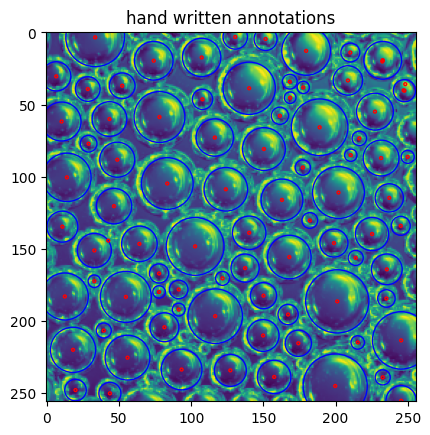

In [ ]:
# plot image with annotations coordinate
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def get_annotations(filename) :
    # Initialize an empty list to store the coordinates
    annotations = []

    # Open the file with the annotations
    with open(filename, 'r') as file:
        # Read each line in the file
        for line in file:
            # Split the line by comma and convert each part to an integer
            x, y, r = line.strip().split(',')
            # Append the coordinate tuple to the annotations list
            annotations.append((float(x), float(y), float(r)))

    # Now annotations contains all the coordinates as tuples
    return annotations

def plot_image_with_annotations(image, annotations, title):
    fig, ax = plt.subplots(1)
    ax.imshow(image)
    ax.set_title(title)
    # width, height = image.shape
    for anno in annotations:
        # user circle as point
        inner_circle = patches.Circle((anno[0], anno[1]), radius=1, linewidth=1, edgecolor='r', facecolor='none')
        ax.add_patch(inner_circle)
        outer_circle = patches.Circle((anno[0], anno[1]), radius=anno[2], linewidth=1, edgecolor='b', facecolor='none')
        ax.add_patch(outer_circle)
    plt.show()

# Show annotations
annotations = get_annotations('data/annotations.txt')
image = plt.imread('data/d1_ex2.png')

image_width, image_height = image.shape
# Adjust annotations to image size
annotations = [
    (width * image_width, height * image_height, radius * ((image_width + image_height) / 2))
    for width, height, radius in annotations
]

# print shape of image
plot_image_with_annotations(image, annotations, 'hand written annotations')


Puis avec l'annotation à la main et l'annotation automatique, on calcule la différence entre chaque point et on attribue un score à la précision de notre algorithme.

La fonction de comparaison des annotations est basée sur l'algorithme de [Hungarian](https://en.wikipedia.org/wiki/Hungarian_algorithm).

In [ ]:
from scipy.spatial.distance import cdist
from scipy.optimize import linear_sum_assignment
import numpy as np

def calculate_alignment_score(hand_annotations, auto_annotations):
    # Create the cost matrix from all pairs of points
    cost_matrix = cdist(hand_annotations, auto_annotations, 'euclidean')

    # If there are more auto_annotations, we don't need to pad the matrix,
    # but we will handle the penalty for extra points later.
    if len(hand_annotations) > len(auto_annotations):
        # Pad auto_annotations with dummy points at max distance
        max_distance = np.max(cost_matrix) * 2  # Use a very high cost for unmatched points
        padded_auto_annotations = np.pad(auto_annotations, [(0, len(hand_annotations) - len(auto_annotations)), (0, 0)], 'constant', constant_values=max_distance)
        cost_matrix = cdist(hand_annotations, padded_auto_annotations, 'euclidean')

    row_ind, col_ind = linear_sum_assignment(cost_matrix)

    # Retrieve the distances for the optimal assignment
    optimal_distances = cost_matrix[row_ind, col_ind]

    # Normalize distances to a score between 0 and 1
    max_distance = np.max(cost_matrix)
    distance_scores = 1 - (optimal_distances / max_distance)
    distance_scores[distance_scores < 0] = 0  # Ignore negative scores due to padding

    # Calculate the average distance score
    average_distance_score = np.mean(distance_scores)

    # Penalty for point count mismatch
    # This penalty increases as the difference in point counts increases
    point_count_penalty = 1 - abs(len(hand_annotations) - len(auto_annotations)) / max(len(hand_annotations), len(auto_annotations))

    # Final score combines distance score and penalty for point count mismatch
    final_score = average_distance_score * point_count_penalty

    return final_score

Puis on applique notre algorithme pour trouver les centres.

0.8578042507130245


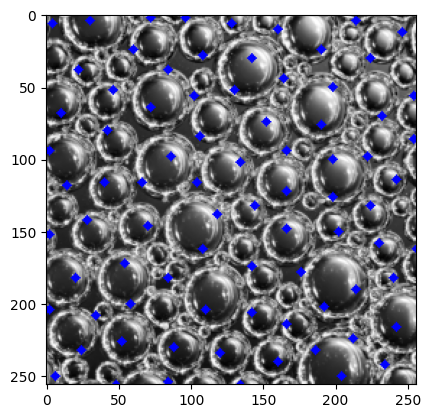

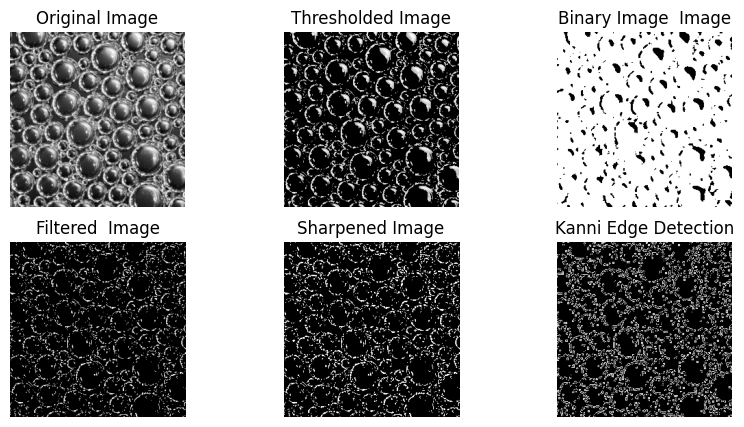

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def preprocess_image(input_image):

    global gray
    global thresholded_image
    global blurred_image
    global binary_image
    global filtered_image
    global sharpened
    global edges
    global processed_image

    gray = input_image

    # Flatten the image to a 1D array
    pixels = gray.flatten()

    # Calculate the 90th percentile value
    percentile_80 = np.percentile(pixels, 80)

    # Set pixels with intensity above the 90th percentile to a specific value
    # e.g., setting them to 0 (black)
    thresholded_image = np.where(gray < percentile_80, 0, gray)

    # Replace the image in 2d
    thresholded_image = thresholded_image.reshape(input_image.shape)

    blurred_image = cv2.medianBlur(thresholded_image, 5)

    plt.imshow(blurred_image)

    # Apply blurred mask onto thresholded_image
    _, binary_image = cv2.threshold(blurred_image, 0, 1, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    binary_image = 1 - binary_image

    # Apply binary mask onto thresholded_image
    filtered_image = thresholded_image * binary_image

    # Sharpen image
    kernel = np.array([[0, -1, 0],
                      [-1, 5, -1],
                      [0, -1, 0]])
    sharpened = cv2.filter2D(filtered_image, -1, kernel)

    edges = cv2.Canny(sharpened, 250, 255)

    return edges

def detect_circle(input_image, hough_circles_params={}) :
    global image_circle
    image_circle = original_image

    # check if all values of hough_circles_params are greater then 0
    for param, value in hough_circles_params.items():
        hough_circles_params[param] = max(1, value)

    # 25.98809200696139, 57.4943666930601, 2.7328908097786124, 2, 56.15591163165465
    # Circle detection
    circles = cv2.HoughCircles(input_image, cv2.HOUGH_GRADIENT,
                               dp=hough_circles_params.get("dp", 1.0),
                               minDist=hough_circles_params.get("minDist",25),
                               param1=hough_circles_params.get("param1",57.4943666930601),
                               param2=hough_circles_params.get("param2", 2.7328908097786124),
                               minRadius=hough_circles_params.get("minRadius",  2),
                               maxRadius=hough_circles_params.get("maxRadius", 56))

    # Circle detection
    auto_points = []
    if circles is not None:
        circles = np.round(circles[0, :]).astype("int")
        for (x, y, r) in circles:
            # cv2.circle(image_circle, (x, y), r, (0, 255, 0), 1)
            auto_points.append((x,y,r))
            cv2.circle(image_circle, (x, y), 1, (0, 0, 255), 3)

    return auto_points

def plot_images() :
    # Plotting
    fig, axs = plt.subplots(2, 3, figsize=(10, 5))

    # Original image
    axs[0][0].imshow(image)
    axs[0][0].set_title("Original Image")
    axs[0][0].axis('off')

    # Blurred image
    axs[0][1].imshow(thresholded_image, cmap='gray')
    axs[0][1].set_title("Thresholded Image")
    axs[0][1].axis('off')

    # Blurred image
    axs[0][2].imshow(binary_image, cmap='gray')
    axs[0][2].set_title("Binary Image  Image")
    axs[0][2].axis('off')

    # Blurred image
    axs[1][0].imshow(filtered_image, cmap='gray')
    axs[1][0].set_title("Filtered  Image")
    axs[1][0].axis('off')

    # Blurred image
    axs[1][1].imshow(sharpened, cmap='gray')
    axs[1][1].set_title("Sharpened Image")
    axs[1][1].axis('off')

    # Edge detection
    axs[1][2].imshow(edges, cmap='gray')
    axs[1][2].set_title("Kanni Edge Detection")
    axs[1][2].axis('off')

    plt.show()

# Load the image
global original_image
original_image = cv2.imread('data/d1_ex2.png')
# processed_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)  # Convert to RGB for Matplotlib
gray = cv2.cvtColor(original_image, cv2.COLOR_RGB2GRAY)

# Call the function with the path to your uploaded image
preprocessed_image = preprocess_image(gray)

# Detect circles
auto_points = detect_circle(preprocessed_image)

plt.imshow(image_circle)

hand_points = np.array(annotations)
auto_points = np.array(auto_points)
score = calculate_alignment_score(hand_points, auto_points)
print(score)

# Plot images
plot_images()

La prochaine section décrit comment optimiser les paramètres de la fonction HoughtCircles.

Basé sur un algorithme Génétique.

In [ ]:
!pip install deap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.4/135.4 kB 2.9 MB/s eta 0:00:00


In [ ]:
import cv2
import numpy as np
from deap import base, creator, tools, algorithms

def evaluate(individual):
    # Parameters unpacked from the individual
    dp, minDist, param1, param2, minRadius, maxRadius = map(int, individual)

    hough_circles_params= {
        "dp" : dp,
        "minDist":minDist,
        "param1":param1,
        "param2":param2,
        "minRadius":minRadius,
        "maxRadius":maxRadius
    }

    # Detect circles
    auto_points = detect_circle(preprocessed_image, hough_circles_params)

    # Fitness evaluation
    if len(auto_points) :
        hand_points = np.array(annotations)
        auto_points = np.array(auto_points)
        fitness = calculate_alignment_score(hand_points, auto_points)
        print(fitness, hough_circles_params)
    else:
        fitness = 0

    return fitness,

In [ ]:
# Define the fitness and individual classes
creator.create("FitnessMax", base.Fitness, weights=(1.0,))
creator.create("Individual", list, fitness=creator.FitnessMax)

toolbox = base.Toolbox()

# Parameter bounds
DP_BOUNDS = (1, 2)
MINDIST_BOUNDS = (1, 100)
PARAM1_BOUNDS = (1, 100)
PARAM2_BOUNDS = (1, 100)
MINRADIUS_BOUNDS = (1, 100)
MAXRADIUS_BOUNDS = (1, 100)

# Attribute generators
toolbox.register("attr_dp", np.random.randint, DP_BOUNDS[0], DP_BOUNDS[1] + 1)
toolbox.register("attr_minDist", np.random.randint, MINDIST_BOUNDS[0], MINDIST_BOUNDS[1] + 1)
toolbox.register("attr_param1", np.random.randint, PARAM1_BOUNDS[0], PARAM1_BOUNDS[1] + 1)
toolbox.register("attr_param2", np.random.randint, PARAM2_BOUNDS[0], PARAM2_BOUNDS[1] + 1)
toolbox.register("attr_minRadius", np.random.randint, MINRADIUS_BOUNDS[0], MINRADIUS_BOUNDS[1] + 1)
toolbox.register("attr_maxRadius", np.random.randint, MAXRADIUS_BOUNDS[0], MAXRADIUS_BOUNDS[1] + 1)

toolbox.register("individual", tools.initCycle, creator.Individual,
                 (toolbox.attr_dp, toolbox.attr_minDist, toolbox.attr_param1, toolbox.attr_param2,
                  toolbox.attr_minRadius, toolbox.attr_maxRadius), n=1)

toolbox.register("population", tools.initRepeat, list, toolbox.individual)

# The evaluation function
toolbox.register("evaluate", evaluate)

# Genetic operators
toolbox.register("mate", tools.cxBlend, alpha=0.5)
toolbox.register("mutate", tools.mutUniformInt, low=[DP_BOUNDS[0], MINDIST_BOUNDS[0], PARAM1_BOUNDS[0], PARAM2_BOUNDS[0], MINRADIUS_BOUNDS[0], MAXRADIUS_BOUNDS[0]],
                 up=[DP_BOUNDS[1], MINDIST_BOUNDS[1], PARAM1_BOUNDS[1], PARAM2_BOUNDS[1], MINRADIUS_BOUNDS[1], MAXRADIUS_BOUNDS[1]], indpb=0.1)
toolbox.register("select", tools.selTournament, tournsize=3)

In [ ]:
population = toolbox.population(n=50)
hof = tools.HallOfFame(1)

stats = tools.Statistics(lambda ind: ind.fitness.values)
stats.register("max", np.max)

# Run the algorithm
algorithms.eaSimple(population, toolbox, cxpb=0.5, mutpb=0.2, ngen=10, stats=stats, halloffame=hof, verbose=True)

best_individual = hof[0]
print(f"Best individual in the run: {best_individual}")
print(f"With fitness: {best_individual.fitness.values}")

0.027245191065112445 {'dp': 2, 'minDist': 79, 'param1': 25, 'param2': 34, 'minRadius': 56, 'maxRadius': 83}
0.019835247142847505 {'dp': 1, 'minDist': 38, 'param1': 49, 'param2': 27, 'minRadius': 50, 'maxRadius': 93}
0.0198643595651009 {'dp': 1, 'minDist': 97, 'param1': 97, 'param2': 1, 'minRadius': 100, 'maxRadius': 6}
0.22673236263912808 {'dp': 2, 'minDist': 13, 'param1': 27, 'param2': 13, 'minRadius': 21, 'maxRadius': 5}
0.005506250302904633 {'dp': 2, 'minDist': 91, 'param1': 85, 'param2': 99, 'minRadius': 2, 'maxRadius': 96}
0.03499983473760921 {'dp': 1, 'minDist': 75, 'param1': 48, 'param2': 8, 'minRadius': 1, 'maxRadius': 42}
0.15117165134512342 {'dp': 1, 'minDist': 11, 'param1': 32, 'param2': 27, 'minRadius': 30, 'maxRadius': 68}
0.01563795867510204 {'dp': 2, 'minDist': 61, 'param1': 39, 'param2': 36, 'minRadius': 81, 'maxRadius': 97}
0.03257623230951922 {'dp': 2, 'minDist': 57, 'param1': 93, 'param2': 44, 'minRadius': 14, 'maxRadius': 34}
0.12662936573220368 {'dp': 2, 'minDist':

## Exercice 3 : Domaine de Fourier (5 pts)

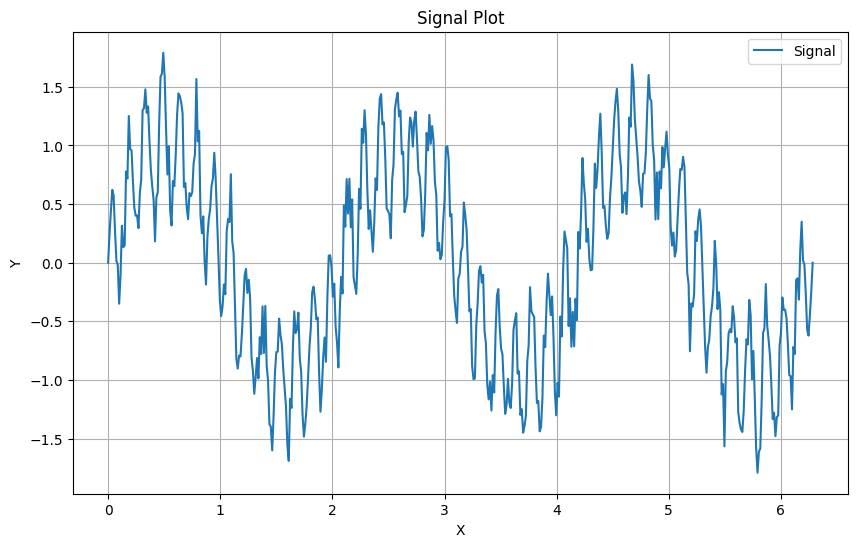

In [ ]:
import pickle
import matplotlib.pyplot as plt

file_path = 'data/d1_ex3.pcl'

# Open the file and load its contents
with open(file_path, 'rb') as file:
    data = pickle.load(file)

# Assuming 'x' and 'y' represent the coordinates or signal values to be plotted
x_values = data.get("x")
y_values = data.get("y")

# Plotting the signal
plt.figure(figsize=(10, 6))
plt.plot(x_values, y_values, label="Signal")
plt.xlabel("X")
plt.ylabel("Y")
plt.title("Signal Plot")
plt.legend()
plt.grid(True)
plt.show()

### a) Calculez la décomposition en série de Fourier du signal fourni dans le fichier d1_q3.pcl pour les 64 premières fréquences (𝑘 ∈ [0, 64]). Affichez le graphe de l’amplitude de chaque fréquence. Quelles sont les fréquences principales du signal et leurs amplitudes?

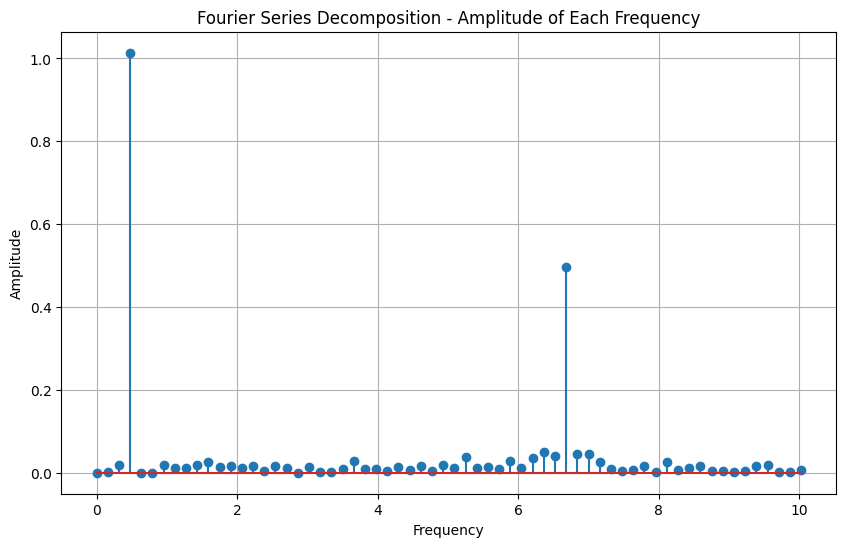

(array([0.47746483, 6.68450761, 6.36619772, 6.84366255, 7.0028175 ]),
 array([1.01381514, 0.4968998 , 0.05005305, 0.04517348, 0.04495893]))

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Extracting x and y values
x = data['x']
y = data['y']

# Number of sample points
N = len(x) # 512
# Sample spacing
T = (x[-1] - x[0]) / N # 0.01227184630308513

# Compute the Fast Fourier Transform (FFT)
yf = np.fft.fft(y)
xf = np.fft.fftfreq(N, T)[:N//2]

# Selecting the first 64 frequencies
n_frequencies = 64
xf = xf[:n_frequencies]
yf_amplitudes = 2.0/N * np.abs(yf[0:n_frequencies])

# Plotting the graph of the amplitude of each frequency
plt.figure(figsize=(10, 6))
plt.stem(xf, yf_amplitudes)
plt.title('Fourier Series Decomposition - Amplitude of Each Frequency')
plt.xlabel('Frequency')
plt.ylabel('Amplitude')
plt.grid(True)
plt.show()

# Identifying main frequencies and their amplitudes
main_frequencies = xf[np.argsort(-yf_amplitudes)[:5]] # Top 5 frequencies
main_amplitudes = np.sort(yf_amplitudes)[::-1][:5]

main_frequencies, main_amplitudes

Le graphique précédent représente les 64 premières fréquences présentes dans le signal d'origine. Les fréquences vont de 0 à 10 Hz. La fréquence zéro étant une fonction constante et la fréquence 10 Hz représentant un sinus avec une période de $1/10$ seconde. Pour une fréquence qui se rapproche de zéro, la période (distance entre deux sommets de la fonction sinusoidale) est plus grande. L'amplitude est la mesure de la force d'une fréquence. Si on a une fréquence de 0.48 Hz avec une amplitude de 1.00 et une fréquence de 6.68 Hz avec une amplitude de 0.50, on peut dire que la fréquence de 0.48 Hz contribue plus au signal d'origine que la fréquence de 6.68 Hz.

Dans le signal d'origine fourni dans le fichier d1_q3.pcl, parmi les 64 plus petites fréquences, les fréquences de 0.48 Hz et 6.68 Hz contribuent de manière significative au signal d'origine, ayant des amplitudes de 1.00 et de 0.50 respectivement. Après ces deux fréquences, les contributions sont négligeables avec des amplitudes de 0.05 et moins.

<br>

__Exemple__
Pour illustrer la combinaison des fréquences et de leurs amplitudes, voici une petite démonstration :

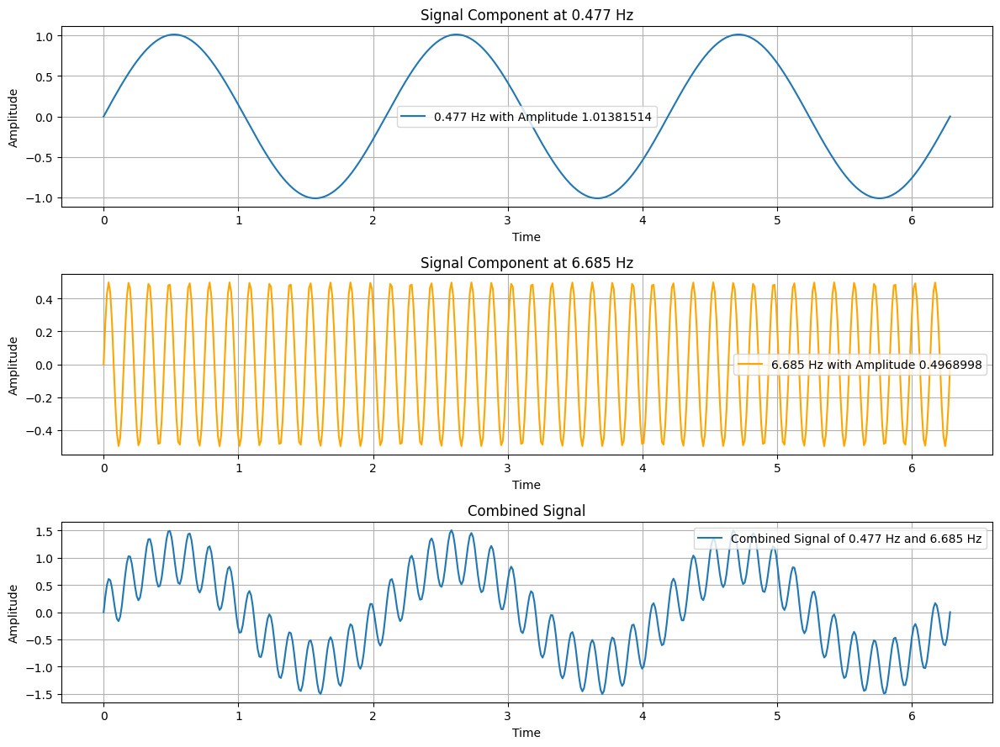

In [ ]:
# Constants for the individual frequencies and their amplitudes
frequency1 = 0.47746483
amplitude1 = 1.01381514
frequency2 = 6.68450761
amplitude2 = 0.4968998

# Correcting time array to match the original signal's duration
t_corrected = np.linspace(x.min(), x.max(), len(x))

# Re-generating the individual signals with corrected time array
signal1_corrected = amplitude1 * np.sin(2 * np.pi * frequency1 * t_corrected)
signal2_corrected = amplitude2 * np.sin(2 * np.pi * frequency2 * t_corrected)

# Re-calculating the combined signal with corrected signals
combined_signal_corrected = signal1_corrected + signal2_corrected

# Corrected plotting
fig, axs = plt.subplots(3, 1, figsize=(12, 9))

# Individual signal for 0.477 Hz
axs[0].plot(t_corrected, signal1_corrected, label=f'0.477 Hz with Amplitude {amplitude1}')
axs[0].set_title('Signal Component at 0.477 Hz')
axs[0].set_xlabel('Time')
axs[0].set_ylabel('Amplitude')
axs[0].legend()
axs[0].grid(True)

# Individual signal for 6.685 Hz
axs[1].plot(t_corrected, signal2_corrected, label=f'6.685 Hz with Amplitude {amplitude2}', color='orange')
axs[1].set_title('Signal Component at 6.685 Hz')
axs[1].set_xlabel('Time')
axs[1].set_ylabel('Amplitude')
axs[1].legend()
axs[1].grid(True)

# Combined signal
axs[2].plot(t_corrected, combined_signal_corrected, label='Combined Signal of 0.477 Hz and 6.685 Hz')
axs[2].set_title('Combined Signal')
axs[2].set_xlabel('Time')
axs[2].set_ylabel('Amplitude')
axs[2].legend()
axs[2].grid(True)

plt.tight_layout()
plt.show()


### b) Filtrez ensuite le signal en retirant la moitié des hautes fréquences et reconstruisez le. Affichez le signal reconstruit.

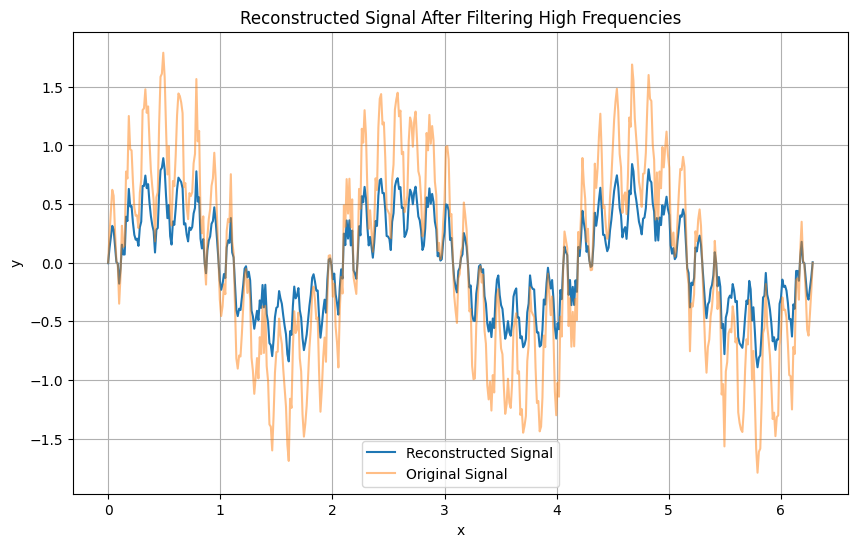

In [ ]:
# Computing the FFT of the signal
fft_y = np.fft.fft(y)

# Number of frequencies to zero out (half of the frequencies)
num_freq_to_zero = len(fft_y) // 2

# Zeroing out the highest half of the frequencies
fft_y_filtered = fft_y.copy()
fft_y_filtered[-num_freq_to_zero:] = 0

# Reconstructing the signal using the inverse FFT
reconstructed_signal = np.fft.ifft(fft_y_filtered)

# Plotting the reconstructed signal
plt.figure(figsize=(10, 6))
plt.plot(x, reconstructed_signal.real, label='Reconstructed Signal')
plt.plot(x, y, label='Original Signal', alpha=0.5)
plt.title('Reconstructed Signal After Filtering High Frequencies')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.grid(True)
plt.show()


En tout, il y a 512 coordonnées x, y dans le signal d'origine. Ici, on applique la transformée de Fourier rapide (FFT) sur le signal et on prend seulement la moitié des plus petites fréquences. Donc, on prend les 256 plus petites valeurs de fréquence, ce qui implique que les petites variations dans le signal (plus grandes fréquences en Hz) disparaîtront. Puisque les amplitudes du signal dominant se trouvent dans les fréquences de base, on enlève du bruit dans le signal pour ne garder que les fréquences avec des amplitudes importantes dans ce cas-ci. En somme, on garde les amplitudes dominantes (le signal reste similaire) tout en supprimant le bruit.

### c) Expliquez comment vous pourriez adapter votre méthode pour effectuer une transformée de Fourier 2D.

Pour compléter une transformée de Fourier en deux dimensions, commençons par ouvrir une image 2D.

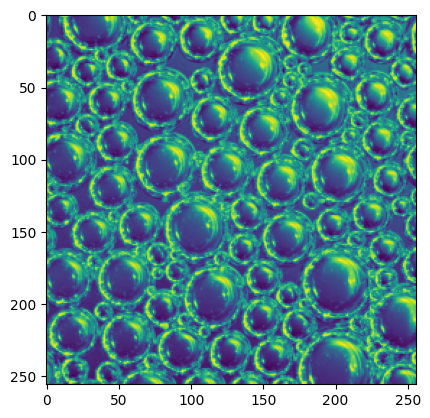

In [ ]:
from numpy.fft import fft, ifft
import matplotlib.pyplot as plt
import numpy as np

# Step 1: Get a 2D image
img = plt.imread('data/d1_ex2.png')
plt.imshow(img)
plt.show()

Ensuite, on calcule pour chaque ligne la transformée de Fourier rapide. Cette transformée de Fourier donne une liste de nombres complexes. Par exemple, si on imprime  

```
print(fft_rows[0][0])
114.33725726418197+0j
```

Pour obtenir la partie du nombre réel (enlever le nombre complexe), on prend la valeur absolue de l'image. Les nombres résultants de cette transformation vont de $128$ à $3.0*10^{-08}$. Pour afficher le résultat de manière visible avec matplotlib, on utilise l'échelle logarithmique.

L'image représente la transformée de Fourier seulement sur les lignes.

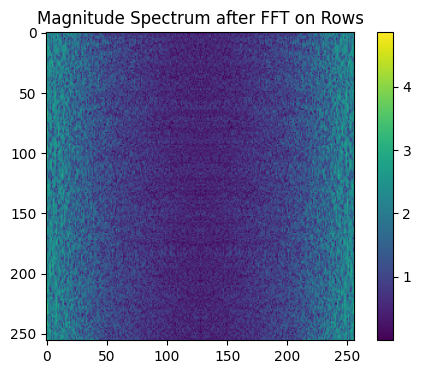

In [ ]:
# Step 2: Apply FFT to each row and plot
fft_rows = np.array([fft(row) for row in img])

magnitude_spectrum_rows = np.abs(fft_rows)

plt.figure(figsize=(6, 4))
plt.imshow(np.log1p(magnitude_spectrum_rows))
plt.title('Magnitude Spectrum after FFT on Rows')
plt.colorbar()
plt.show()

Ensuite, on réapplique la transformée de Fourier sur les lignes déjà transformées dans le domaine de Fourier. Encore une fois, il est nécessaire de prendre seulement la partie réelle et de mettre le tout à l'échelle logarithmique.

Cette fois-ci, on obtient la transformée de Fourier en deux dimensions. Dans les 4 coins, on a les fréquences de base qui représentent les gros détails dans l'image.

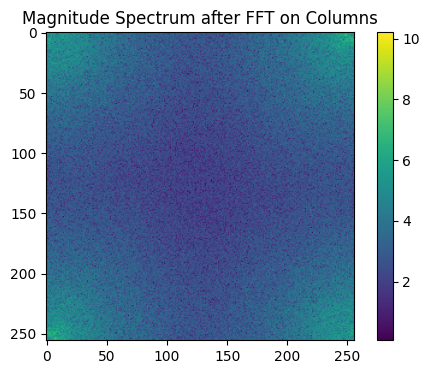

In [ ]:
# Step 3: Apply FFT to each column of the result from step 2 and plot
fft2_manual = np.array([fft(col) for col in fft_rows.T]).T
magnitude_spectrum_2d = np.abs(fft2_manual)

plt.figure(figsize=(6, 4))
plt.imshow(np.log1p(magnitude_spectrum_2d))
plt.title('Magnitude Spectrum after FFT on Columns')
plt.colorbar()
plt.show()

Ordinairement, on veut avoir les grandes fréquences au centre. Ce que l'on appelle le fft_shift est l'algorithme qui permet de remettre les basses fréquences au centre de l'image. Ici, on applique cet algorithme à la transformée de Fourier en deux dimensions.

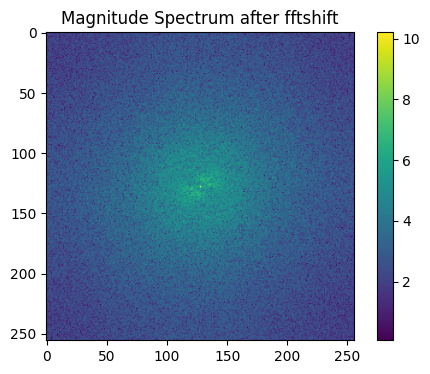

In [ ]:
# Step 4: Apply fftshift and plot

# Determine the number of rows and columns in fft
rows, cols = fft2_manual.shape
row_mid = rows // 2
col_mid = cols // 2

fft2_shifted = np.zeros_like(fft2_manual)

# Swap the quadrants
# Top-left with bottom-right
fft2_shifted[:row_mid, :col_mid], fft2_shifted[row_mid:, col_mid:] = fft2_manual[row_mid:, col_mid:], fft2_manual[:row_mid, :col_mid]
# Top-right with bottom-left
fft2_shifted[:row_mid, col_mid:], fft2_shifted[row_mid:, :col_mid] = fft2_manual[row_mid:, :col_mid], fft2_manual[:row_mid, col_mid:]

magnitude_spectrum_shifted = np.abs(fft2_shifted)

plt.figure(figsize=(6, 4))
plt.imshow(np.log1p(magnitude_spectrum_shifted))
plt.title('Magnitude Spectrum after fftshift')
plt.colorbar()
plt.show()

L'image finale est l'équivalent de la transformée de Fourier 2D (fft2 et fftshift).

Pour cette image, on remarque qu'il y a beaucoup de basses fréquences qui se dispersent tranquillement dans toutes les directions. Cela a beaucoup de sens, car dans l'image originale, il y a plusieurs bulles de différentes formes. Les sinus et les cosinus à fréquence basse sont plus présents dans l'image que les petits détails. Il n'y a pas de lignes horizontales ou verticales.


On peut même vérifier que la transformée de Fourier en deux dimensions par numpy est équivalente !

In [ ]:
# Using numpy's fft2 for validation
fft2_numpy = np.fft.fft2(img)

# Compare the first few elements to check if our manual implementation matches numpy's fft2
comparison = np.isclose(fft2_manual, fft2_numpy)

# Check if all elements are close
all_close = np.all(comparison)

print(all_close)
# all_close, fft2_manual[:2, :2], fft2_numpy[:2, :2]  # Display a small sample for comparison


True


## Références

# OTHER

In [ ]:
!pip install nbconvert
!apt-get install texlive texlive-xetex texlive-latex-extra pandoc

In [ ]:
!jupyter nbconvert --to pdf INF889G_TP1.ipynb

[NbConvertApp] WARNING | pattern 'INF889G_TP1.ipynb' matched no files
This application is used to convert notebook files (*.ipynb)
        to various other formats.


Options
The options below are convenience aliases to configurable class-options,
as listed in the "Equivalent to" description-line of the aliases.
To see all configurable class-options for some <cmd>, use:
    <cmd> --help-all

--debug
    set log level to logging.DEBUG (maximize logging output)
    Equivalent to: [--Application.log_level=10]
--show-config
    Show the application's configuration (human-readable format)
    Equivalent to: [--Application.show_config=True]
--show-config-json
    Show the application's configuration (json format)
    Equivalent to: [--Application.show_config_json=True]
--generate-config
    generate default config file
    Equivalent to: [--JupyterApp.generate_config=True]
-y
    Answer yes to any questions instead of prompting.
    Equivalent to: [--JupyterApp.answer_yes=True]
--execute
   